# Deep Variational Information Bottleneck

[Deep Variational Information Bottleneck](https://arxiv.org/abs/1612.00410)

The paper interprets **deep neural networks** from an information theoretic point of view. The input random variable $X$ gets mapped to a representation $Z$ using a stochastic parametric $p(\textbf{z}\;|\;\textbf{x}; \theta)$, where $\theta$ is a set of learnable parameters. 

The goal is to learn an encoding that is maximally informative about a target $Y$, measured by the **mutual information** between the encoding $Z$ and the target $Y$. The mutual information $I(Z, Y; \theta)$ is defined as follows 
$$
	I(Z, Y; \theta) = \int p(z, y | \theta) \log \frac{p(z, y | \theta)}{p(z|\theta) p(y|\theta)} dx dy
$$
where $p(y|\theta) = p(y)$, because the target $Y$ is independent of $\theta$. 

If this was our only objective, we could always ensure a maximally informative representation by taking the identity encoding of our data ($Z = X$), but this is not a useful representation of our data. Instead, we would like to find the best representation $Z$ subject to a constraint on the complexity of $Z$. A natural and useful constraint to apply is on the mutual information between the encoding $Z$ and the original data $X$, i.e., $I(X, Z) < I_C$, where $I_C$ is the information constraint. As a result, the objective becomes:
$$
	\argmax_{\theta} I(Z, Y; \theta) \quad \text{s.t. } I(X, Z; \theta) \leq I_C.
$$
By introducing a Lagrange multiplier $\beta$, we can maximize the unconstrained objective function $\argmax_\theta R_{IB}(\theta)$, where
$$
	R_{IB}(\theta) = I(Z, Y; \theta) - \beta I(Z, X; \theta). 
$$
The goal is therefore to learn an encoding $Z$ that is
 
- Maximally **expressive** about $Y$, i.e., $I(Z, Y; \theta)$ encourages $Z$ to be predictive of $Y$;
  
- Maximally **compressive** about $X$, i.e., $\beta I(Z, X; \theta)$ encourages $Z$ to "forget" $X$

The Lagrange multiplier $\beta \geq 0$ controls the tradeoff between **expressiveness** and **compressiveness**. Large $\beta$ results in a highly compressed representation, because $\beta I(Z, X; \theta)$ will be small. 

> Essentially, the objective forces $Z$ to act like a **minimal sufficient statistic** of $X$ for predicting $Y$. 

The **Information Bottleneck** (IB) principle defines what we mean by a **good representation**, in terms of the fundamental tradeoff between having a **concise representation** and one with **good predictive power**.

The main drawback is that computing mutual information is in general **computationally challenging**, except for the cases:
- where $X, Y$, and $Z$ are all discrete.
- where $X, Y$, and $Z$ are all jointly Gaussian. 

## Method

We assume that the joint distribution $p(X, Y, Z)$ factors as follows
$$
	p(X, Y, Z) = p(Z | X, Y) p(Y | X) p(X) = p(Z | X) p(Y | X) p(X)
$$
where it is assumed that $p(Z|X, Y) = p(Z|X)$.

The intuition behind this network is that $Z$ cannot directly depend on the target $Y$. 

Besides the structure of the joint $p(X, Y)$, the only part of the model available is the stochastic encoder $p(Z | X)$. 

## Deep dive into the IB objective

Examination of the Information bottleneck objective:
$$
	I(Z, Y) - \beta I(Z, X)
$$

### First part: $I(Z, Y)$

Start with $I(Z, Y)$, which is defined as 
$$
	I(Z, Y) = \int p(y, z) \log \frac{p(y, z)}{p(y)p(z)} dy dz = \int p(y, z) \log \frac{p(y|z)}{p(y)} dy dz
$$
where $p(y|z)$ is defined by the Markov Chain structure:
$$
	p(y|z) = \int p(x, y | z) dx = \int \frac{p(x, y, z)}{p(z)} dx = \int \frac{p(z|x)p(y|x)p(x)}{p(z)} dx
$$
Because this integral is intractable, $q(y|z)$ be a **variational approximation** to $p(y|z)$. This distribution acts as the **decoder** parameterized by a neural network. To force the $q(y|z)$ to be similar to $p(y|z)$, we can use the Kullback Leibler divergence $D_{KL}(p(Y|Z)||q(Y|Z))$. Since $D_{KL}$ is always positive, we have
$$
\begin{align*}
	D_{KL}(p(Y|Z)||q(Y|Z)) &\geq 0 \\
	\int p(y|z) \log \frac{p(y|z)}{q(y|z)} dy &\geq 0 \\
	\underbrace{\int p(y|z) \log p(y|z) dy}_{-H(p)} \;\;\underbrace{- \int p(y|z) \log q(y|z) dy}_{H(p, q)} &\geq 0 \\ 
	\int p(y|z) \log p(y|z) dy &\geq \int p(y|z) \log q(y|z) dy  \\ 
	
\end{align*}
$$
In other words, the negative entropy $-H(p)$ is always greater or equal to the positive cross-entropy $H(p, q)$. 

If we replace $q(y|z)$ in the mutual information $I(Z, Y)$, we get the inequality:
$$
\begin{align*}
	I(Z, Y) &\geq \int p(y, z) \log \frac{q(y|z)}{p(y)} dy dz \\
	&= \int p(y, z) \log q(y|z) dy dz - \int \underbrace{p(y, z)}_{=p(y)} \log p(y) dy dz \\
	&= \int p(y, z) \log q(y|z) dy dz - H(Y)
\end{align*}
$$
Notice that $p(y, z) = p(z)p(y|z) = p(z)p(y)$, which reduces the integral to 
$$
	\int p(y)\log p(y) \underbrace{\int p(z) dz}_{=1} dy = \int p(y)\log p(y)dy = 
$$Also notice that the entropy term $H(Y)$ is independent of the optimization task and thus be ignored.

The first term can be rewritten using the factorization of the Markov chain, which gives us a lower bound 
$$
	I(Z, Y) \geq \int \underbrace{p(y|x) p(z|x) p(x)}_{\text{Markov chain}} \log q(y|z) dx dy dz
$$
This only requires samples from the joint $p(x, y)$ and the stochastic encoder $p(z|x)$, and is tractable if the variational approximation $q(y|z)$ is tractable. 
### Second part: $\beta I(Z, X)$

We now consider $\beta I(Z, X)$:
$$
	I(Z, X) = \int p(x, z) \log \frac{p(z|x)}{p(z)} dz dx
$$
Computing the marginal $p(Z)$ might be difficult. Therefore, let $r(z)$ be a variational approximation to this marginal. Again using the KL divergence we get
$$
	D_{KL}(p(Z)||r(Z)) \geq 0 \implies \int p(z) \log p(z) dz \geq \int p(x)p(z|x) \log r(z) dz
$$
Replacing $p(z)$ in the denominator of the log term of $I(Z, Y)$ by the variational approximation $r(z)$ results in the inequality flipping. 
$$
	I(Z, X) \leq \int p(x) p(z|x) \log \frac{p(z|x)}{r(z)} dz dx
$$
> **Intuition**: We know that $p(z) \geq r(z)$ via the KL inequality, thus we get
> $$ p(z) \geq r(z) \xrightarrow{\times \dfrac{1}{p(z)}} 1 \geq r(z) \frac{1}{p(z)} \xrightarrow{\times \dfrac{1}{r(z)}} \frac{1}{r(z)} \geq \frac{1}{p(z)}$$
> which is the same as flipping the inequality, i.e., $\dfrac{1}{p(z)} \leq \dfrac{1}{r(z)}$

Lastly, note that multiplying $I(Z, X)$ by $-\beta$ again flips the inequality
$$
	-\beta I(Z, X) \geq -\beta \int p(x) p(z|x) \log \frac{p(z|x)}{r(z)} dz dx
$$

### Combining both variational bounds

Combining both bounds, we obtain
$$
\begin{align*}
	I(Z, Y) - \beta I(Z, X) &\geq \underbrace{\int p(y|x) p(z|x) p(x) \log \textcolor{magenta}{q(y|z)} dx dy dz}_{\approx I(Z, Y)} \\
	&- \beta \underbrace{\int p(x) p(z|x) \log \frac{p(z|x)}{\textcolor{magenta}{r(z)}} dz dx}_{\approx I(Z, X)} = L
\end{align*}
$$
Thus, $L$ acts as a lower bound on the original information bottleneck objective $I(Z, Y) - \beta I(Z, X)$. Notice that in the first term $p(y|x)p(x) = p(x, y)$, which can be approximated empirically via the **Dirac delta function**
$$
	p(x, y) \approx \frac{1}{N} \sum_{i=1}^N \delta_{x_i}(x)\delta_{y_i}(y)
$$
where $\delta_{a}(b) = \begin{cases} 1 & \text{if } a = b \\ 0 & \text{otherwise}\end{cases}$. If we replace the joint by the empirical joint distribution, we get
$$
\begin{align*}
	L &\approx \frac{1}{N}\sum_{i=1}^N \int p(z|x_i) \log q(y_i|z) - \beta\; p(z|x_i) \log \frac{p(z|x_i)}{r(z)} dz\\
	&\approx \frac{1}{N}\sum_{i=1}^N \mathbb{E}_{p(z|x_i)} \left[\log q(y_i|z) \right] - \beta\; D_{KL}(p(Z|x_i)\;||\; r(Z))\\
\end{align*}
$$
As can be seen, the integration over $dx, dy$ is eliminated by using the approximation of the joint $p(x, y)$. 

The encoder is assumed to be a normal distribution
$$
	p(z|x) = \mathcal{N}(z|f_{\text{Enc}}^\mu(x), f_{\text{Enc}}^\Sigma(x))
$$
where $f_{\text{Enc}}^\mu(x)$ and $f_{\text{Enc}}^\Sigma(x)$ are parameterized by a neural network that outputs a $k$-dimensional mean $\mu$ and a $k\times k$ covariance matrix $\Sigma$. The reparametrization trick is applied to make the random factor of the distribution $p(z|x)$ (which is the noise term) independent of the model $f_{\text{Enc}}$. 

```mermaid
flowchart LR
    f("$$\mu, \Sigma = f_{\text{Enc}}(x)$$") --> comb("$$\mu + \Sigma \epsilon$$")
    eps("$$\epsilon \in N(0, I) $$") --> comb
    comb --> p("$$p(z|x)$$")
```

Explicitly computing $z$ then becomes trivial as $z = \mu + \Sigma \epsilon$, where $\epsilon \in \mathcal{N}(0, I)$.  Assuming that it is possible to compute an analytic KL divergence $D_{KL}(p(z|x)\;||\; r(z))$, we can put everything together to get the following objective function.
$$
	\argmin_{\theta} J_{IB}(\theta) = \argmin_{\theta} \frac{1}{N}\sum_{i=1}^N \mathbb{E}_{\epsilon \sim \mathcal{N}(0, I)} \left[-\log q(y_i|f_{\text{Enc}}(x_i, \epsilon; \theta)) \right] + \beta\; D_{KL}(p(Z|x_i)\;||\; r(Z))
$$
In words,  
1. we minimize the **expected negative log-likelihood** of the decoder $\mathbb{E}_{\epsilon \sim \mathcal{N}(0, I)} \left[-\log q(y_i|f_{\text{Enc}}(x_i, \epsilon; \theta)) \right]$, i.e., maximize the log-likelihood of the decoder which is a lower bound on $I(Z, Y)$; and
2. we minimize the KL divergence between the encoder $p(Z|x_i)$ and the approximate marginal $r(Z)$, regularized via the Lagrange multiplier $\beta$. 

## Implementation details

Encoder network $f_{\text{Enc}}$ for MNIST is an MLP of the form 
$$
	784 \rightarrow 1024 \rightarrow 1024 \rightarrow 2k 
$$
where $k$ is the size of the bottleneck. The first $k$ outputs are used to encode $\mu$, and the remaining $k$ outputs are used to encode $\Sigma$ after applying a softplus transform. 

the decoder is a simple logistic regression model of the form $q(y|z) = \text{softmax}(f_{\text{Dec}}(z))$, where $f_{\text{Dec}}(z) = Wz+b$, which maps $k$-dimensional latent codes to the logits of the $C=10$ classes of MNIST. 

Finally, the approximation of the marginal $r(z)$ is a fixed spherical $k$-dimensional Gaussian, i.e., $r(z) = \mathcal{N}(z|0, I)$. 

In [1]:
import torch
from torch import nn
from torch.nn import functional as F

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

## Simple classification problem

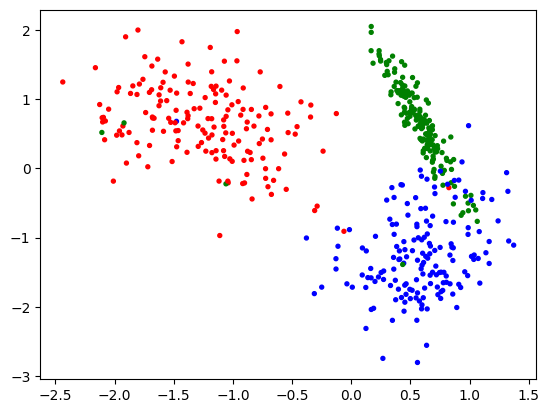

In [164]:
from sklearn.datasets import make_classification
from matplotlib.colors import ListedColormap
cmap1 = ListedColormap(['red', 'blue', 'green'])
cmap2 = ListedColormap(['orange', 'cyan', 'lime'])

# maak classificatie dataset 
X, y = make_classification(
    n_samples=500, 
    n_features=2, 
    n_informative=2, 
    n_redundant=0, 
    n_repeated=0, 
    n_classes=3,
    n_clusters_per_class=1,
    class_sep=1.8,
    random_state=41
)
X = (X - X.mean())/X.std() # standaardiseer dataset (mean 0, variance 1)

# maak meshgrid om beslisgrenzen te laten zien
xmin = X[:, 0].min(); xmax = X[:, 0].max()
ymin = X[:, 1].min(); ymax = X[:, 1].max()
xx, yy = np.meshgrid(
    np.linspace(xmin-.5, xmax+.5, 100),
    np.linspace(ymin-.5, ymax+.5, 100)
)
D = np.vstack((xx.flatten(), yy.flatten())).T

plt.scatter(X[:, 0], X[:, 1], s=8, c=y, cmap=cmap1)
plt.show()

In [165]:
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(
        self, 
        X: np.ndarray,
        y: np.ndarray,
    ):
        # convert data into torch tensors
        self.X = torch.tensor(X).to(torch.float32)
        self.y = torch.tensor(y).to(torch.long)
        
    def __getitem__(self, index):
        return self.X[index], self.y[index]

    def __len__(self):
        return len(self.X)

In [ ]:
class VAE(nn.Module):
    def __init__(self, encoder, decoder, z_size=2):
        super().__init__()
        self.z_size = z_size
        self.enc = encoder
        self.dec = decoder
    
    def encode(self, X: torch.Tensor):
        h = self.enc(X) # (batch_size, 2*z_dim)
        mu = h[:, :self.z_size].view(-1, self.z_size)       # mean vec mu: (batch_size, z_dim)
        log_var = h[:, self.z_size:].view(-1, self.z_size)  # log variance:(batch_size, z_dim)
        return mu, log_var
    
    def decode(self, mu: torch.Tensor, log_var: torch.Tensor):
        eps = torch.randn(mu.shape[0], self.z_size).to(mu.device) # random eps \sim N(0, I)
        z = mu + torch.exp(0.5 * log_var) * eps
        y = self.dec(z)
        return y, z
    
    def forward(self, X: torch.Tensor):
        mu, log_var = self.encode(X)
        y, z = self.decode(mu, log_var)
        return y, z, mu, log_var

In [168]:
from collections import defaultdict

def train_model(model, max_epochs, train_dataloader, val_dataloader, optimizer, device, beta, verbose=False):
    # maintain history of train/val losses
    history = defaultdict(list)

    for epoch in range(max_epochs): 
        
        batch_loss = []
        for batch_X, batch_y in train_dataloader:
            
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)

            preds, _, mu, log_var = model(batch_X)
        
            # from the original VAE paper
            kl_reg = torch.mean(- 0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp(), dim=1))
            ce_loss = F.cross_entropy(preds, batch_y)
            loss = ce_loss + beta * kl_reg

            batch_loss.append([loss.item(), ce_loss.item(), kl_reg.item()])

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        batch_loss = np.array(batch_loss)
        history['Training total loss'].append(batch_loss[:, 0].mean())
        history['Training CE loss'].append(batch_loss[:, 1].mean())
        history['Training KL loss'].append(batch_loss[:, 2].mean())
        
        with torch.no_grad():

            batch_loss = []
            for batch_X, batch_y in val_dataloader:
                
                batch_X, batch_y = batch_X.to(device), batch_y.to(device)

                preds, _, mu, log_var = model(batch_X)
        
                kl_reg = torch.mean(- 0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp(), dim=1))
                ce_loss = F.cross_entropy(preds, batch_y)
                loss = ce_loss + beta * kl_reg

                batch_loss.append([loss.item(), ce_loss.item(), kl_reg.item()])

            batch_loss = np.array(batch_loss)
            history['Validation total loss'].append(batch_loss[:, 0].mean())
            history['Validation CE loss'].append(batch_loss[:, 1].mean())
            history['Validation KL loss'].append(batch_loss[:, 2].mean())
            
        if verbose: print(f"{epoch=} \tTraining total loss, CE, KL = ({history['Training total loss'][-1]:.4f}, {history['Training CE loss'][-1]:.4f}, {history['Training KL loss'][-1]:.4f})\tValidation total loss, CE, KL = ({history['Validation total loss'][-1]:.4f}, {history['Validation CE loss'][-1]:.4f}, {history['Validation KL loss'][-1]:.4f})")
    
    return history

In [204]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Training constants
learning_rate = 1e-3
max_epochs = 500

# define model
z_size=2
hidden_size = 10

In [205]:
from torch.utils.data import DataLoader, random_split

batch_size = 64

# create dataset
dataset = CustomDataset(X, y)
# randomly split the dataset into train, validation, test sets
train_set, val_set, test_set = random_split(dataset, [0.8, 0.1, 0.1])

# create dataloaders from train, val, test sets
train_dataloader = DataLoader(train_set, batch_size, shuffle=True)
val_dataloader = DataLoader(val_set, batch_size, shuffle=True)
test_dataloader = DataLoader(test_set, batch_size, shuffle=False)

### Training

In [206]:
betas = [1e-3, 1e-2, 1e-1, 1e-0, 1e+1, 1e+2, 1e+3]

results = {}

for beta in betas:
    
    enc = nn.Sequential(
        nn.Linear(2, hidden_size),
        nn.ReLU(),
        nn.Linear(hidden_size, 2*z_size)  
    )
    dec = nn.Sequential(
        nn.Linear(z_size, hidden_size),
        nn.ReLU(),
        nn.Linear(hidden_size, 3)
    )

    model = VAE(enc, dec, z_size=2).to(device)

    optimizer = torch.optim.Adam(model.parameters(), learning_rate)

    print(f"Training model with {beta=}")
    history = train_model(model, max_epochs, train_dataloader, val_dataloader, optimizer, device, beta, verbose=False)

    results[beta] = (model, history)

Training model with beta=0.001
Training model with beta=0.01
Training model with beta=0.1
Training model with beta=1.0
Training model with beta=10.0
Training model with beta=100.0
Training model with beta=1000.0


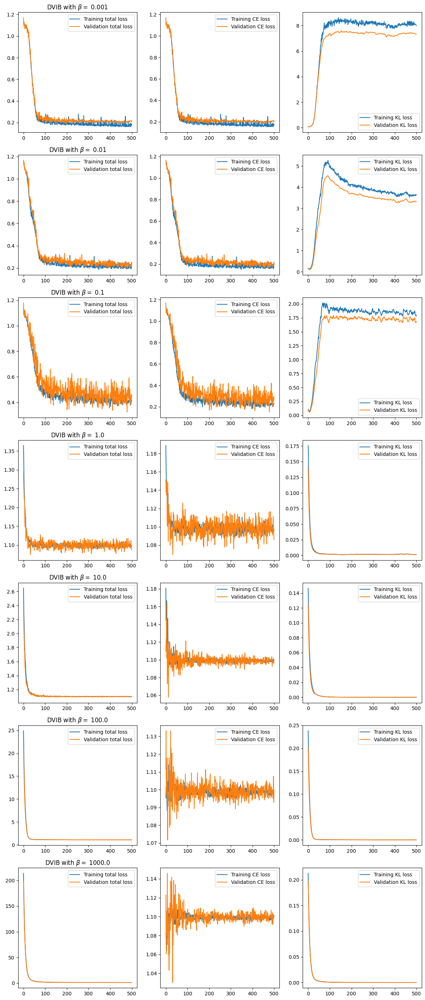

In [208]:
fig, axes = plt.subplots(len(betas), 3, figsize=(4*3, 4*len(betas)))

for beta, ax_row in zip(betas, axes):

    _, history = results[beta]

    ax1, ax2, ax3 = ax_row
    ax1.set_title(fr'DVIB with $\beta=$ {beta}')
    ax1.plot(history['Training total loss'], label='Training total loss')
    ax1.plot(history['Validation total loss'], label='Validation total loss')
    ax1.legend()

    ax2.plot(history['Training CE loss'], label='Training CE loss')
    ax2.plot(history['Validation CE loss'], label='Validation CE loss')
    ax2.legend()

    ax3.plot(history['Training KL loss'], label='Training KL loss')
    ax3.plot(history['Validation KL loss'], label='Validation KL loss')
    ax3.legend()

plt.tight_layout()

### Decision boundaries when sampling once from $p(z | x) = \mathcal{N}(\mu_\theta(x), \Sigma_\theta(x))$

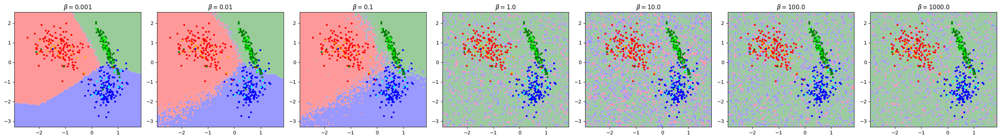

In [ ]:
fig, axes = plt.subplots(1, len(betas), figsize=(4*len(betas), 4))

D_tensor = torch.Tensor(D).to(device)

for beta, ax in zip(betas, axes):

    model, _ = results[beta]

    y_pred, _, _, _ = model(D_tensor)

    decisions = y_pred.cpu().reshape(*xx.shape, 3).argmax(dim=-1)

    ax.contourf(xx, yy, decisions, cmap=cmap1, alpha=0.4, antialiased=True)
    ax.scatter(train_set[:][0][:, 0], train_set[:][0][:, 1], s=8, c=train_set[:][1], cmap=cmap1)
    ax.scatter(test_set[:][0][:, 0], test_set[:][0][:, 1], s=8, c=test_set[:][1], cmap=cmap2)
    ax.set_title(fr"$\beta = {beta}$")

plt.tight_layout()

### Decision boundaries when sampling $k$ times from $p(z | x) = \mathcal{N}(\mu_\theta(x), \Sigma_\theta(x))$

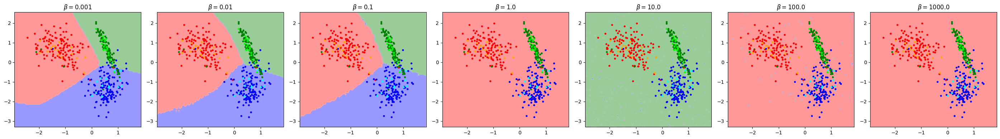

In [217]:
fig, axes = plt.subplots(1, len(betas), figsize=(4*len(betas), 4))

k = 100

D_tensor = torch.Tensor(D).to(device)

for beta, ax in zip(betas, axes):

    model, _ = results[beta]

    _, _, mu, log_var = model(D_tensor)

    eps = torch.randn(k, mu.shape[0], z_size).to(mu.device) # random eps \sim N(0, I)
    z = mu + torch.exp(0.5 * log_var) * eps
    y_pred = model.dec(z.mean(dim=0))
    
    decisions = y_pred.cpu().reshape(*xx.shape, 3).argmax(dim=-1)

    ax.contourf(xx, yy, decisions, cmap=cmap1, alpha=0.4, antialiased=True)
    ax.scatter(train_set[:][0][:, 0], train_set[:][0][:, 1], s=8, c=train_set[:][1], cmap=cmap1)
    ax.scatter(test_set[:][0][:, 0], test_set[:][0][:, 1], s=8, c=test_set[:][1], cmap=cmap2)
    ax.set_title(fr"$\beta = {beta}$")

plt.tight_layout()

### Latent space geometry

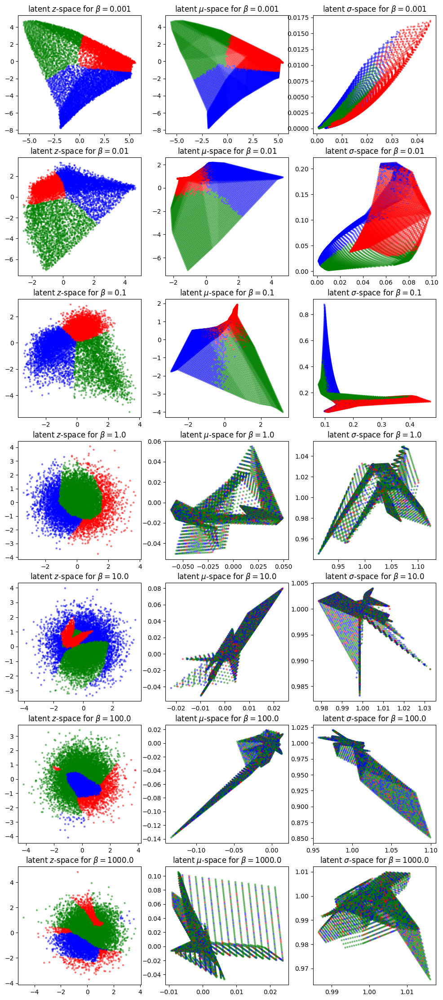

In [ ]:
fig, axes = plt.subplots(len(betas), 3, figsize=(4*3, 4*len(betas)))

D_tensor = torch.Tensor(D).to(device)

for beta, (ax1, ax2, ax3) in zip(betas, axes): 

    model, _ = results[beta]

    y_pred, z, mu, log_var = model(D_tensor)

    decisions = y_pred.cpu().detach().argmax(dim=-1)

    z = z.cpu().detach()
    mu = mu.cpu().detach()
    log_var = log_var.exp().cpu().detach()
    ax1.scatter(z[:, 0], z[:, 1], c=decisions, cmap=cmap1, s=5, alpha=0.4)
    ax1.set_title(fr'latent $z$-space for $\beta = {beta}$')

    ax2.scatter(mu[:, 0], mu[:, 1], c=decisions, cmap=cmap1, s=5, alpha=0.4)
    ax2.set_title(fr'latent $\mu$-space for $\beta = {beta}$')

    ax3.scatter(log_var[:, 0], log_var[:, 1], c=decisions, cmap=cmap1, s=5, alpha=0.4)
    ax3.set_title(fr'latent $\sigma$-space for $\beta = {beta}$')

plt.tight_layout()

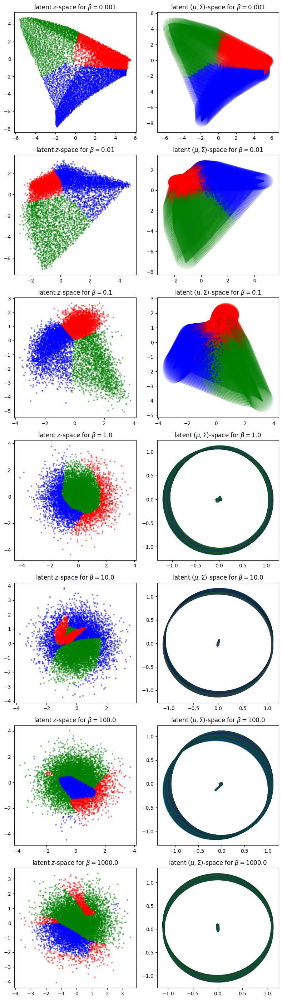

In [220]:
from matplotlib.patches import Ellipse
from matplotlib.collections import PatchCollection

fig, axes = plt.subplots(len(betas), 2, figsize=(4*2, 4*len(betas)))

D_tensor = torch.Tensor(D).to(device)

for beta, (ax1, ax2) in zip(betas, axes): 

    model, _ = results[beta]

    y_pred, z, mu, log_var = model(D_tensor)

    decisions = y_pred.cpu().detach().argmax(dim=-1)

    ax1.scatter(z[:, 0].cpu().detach(), z[:, 1].cpu().detach(), c=decisions, cmap=cmap1, s=5, alpha=0.4)
    ax1.set_title(fr'latent $z$-space for $\beta = {beta}$')

    covs = (log_var.detach().exp().cpu().numpy()[..., None] * np.identity(2))
    eigvals, eigvecs = np.linalg.eigh(covs)
    angles = np.degrees(np.arctan2(eigvecs[:, 1, 0], eigvecs[:, 0, 0]))

    n_std = 1.0  # Number of standard deviations
    shape = 2 * n_std * np.sqrt(eigvals+1j)
    widths = shape[:, 0].real
    heights = shape[:, 1].real

    colors = cmap1(np.arange(3))

    ellipses = [Ellipse(xy=mu[i], width=widths[i], height=heights[i], angle=angles[i], alpha=0.1) for i in range(len(mu))]
    collection = PatchCollection(ellipses, alpha=0.1, linewidths=1, facecolors='none', edgecolors=colors[decisions])

    ax2.add_collection(collection)
    ax2.scatter(mu[:, 0].cpu().detach(), mu[:, 1].cpu().detach(), c=decisions, cmap=cmap1, s=5, alpha=0.4)
    ax2.set_title(fr'latent $(\mu, \Sigma)$-space for $\beta = {beta}$')

plt.tight_layout()

## MNIST

In [222]:
import torchvision
import torchvision.transforms as transforms

DOWNLOAD_PATH = '../datasets'

# normalize so that the mean of the data is zero and the variance is one
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)) 
])

train_val = torchvision.datasets.MNIST(root=DOWNLOAD_PATH, train=True, download=True, transform=transform)
test = torchvision.datasets.MNIST(root=DOWNLOAD_PATH, train=False, download=True, transform=transform)
train, val = torch.utils.data.random_split(train_val, [55000, 5000])

len(train), len(val), len(test)

(55000, 5000, 10000)

In [223]:
from torch.utils.data import DataLoader

batch_size = 128
train_loader = DataLoader(train, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test, batch_size=len(test), shuffle=True)
val_loader = DataLoader(val, batch_size=len(val), shuffle=True)

In [224]:
class Encoder(nn.Module):
    def __init__(self, z_size=2):
        super().__init__()
        self.z_size = z_size
        self.net = nn.Sequential(
            # 32 -> 16
            nn.Conv2d(1, 64, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64, affine=True),
            nn.ReLU(inplace=True),
            # 16 -> 8
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128, affine=True),
            nn.ReLU(inplace=True),
            # 8 -> 4
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256, affine=True),
            nn.ReLU(inplace=True),
            # 4 -> 1
            nn.Conv2d(256, z_size, kernel_size=3, stride=2, padding=0, bias=False),
        )
    
    def forward(self, X: torch.Tensor):
        return self.net(X)

class Decoder(nn.Module):
    def __init__(self, z_size=2, d_size=100, n_classes=10):
        super().__init__()
        self.z_size = z_size
        self.net = nn.Sequential(
            nn.Linear(z_size, d_size),
            nn.ReLU(),
            nn.Linear(d_size, n_classes)
        )

    def forward(self, X: torch.Tensor):
        return self.net(X)

In [226]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Training constants
learning_rate = 1e-3
max_epochs = 10

# define model parameters
z_size = 2
d_size = 100
n_classes = 10

### Training

In [227]:
betas = [1e-3, 1e-2, 1e-1, 1e-0, 1e+1, 1e+2, 1e+3]

results = {}

for beta in betas:
    
    enc = Encoder(2*z_size)
    dec = Decoder(z_size, d_size=d_size, n_classes=n_classes)

    model = VAE(enc, dec, z_size=2).to(device)

    optimizer = torch.optim.Adam(model.parameters(), learning_rate)

    print(f"Training model with {beta=}")
    history = train_model(model, max_epochs, train_loader, val_loader, optimizer, device, beta, verbose=False)

    results[beta] = (model, history)

Training model with beta=0.001
Training model with beta=0.01
Training model with beta=0.1
Training model with beta=1.0
Training model with beta=10.0
Training model with beta=100.0
Training model with beta=1000.0


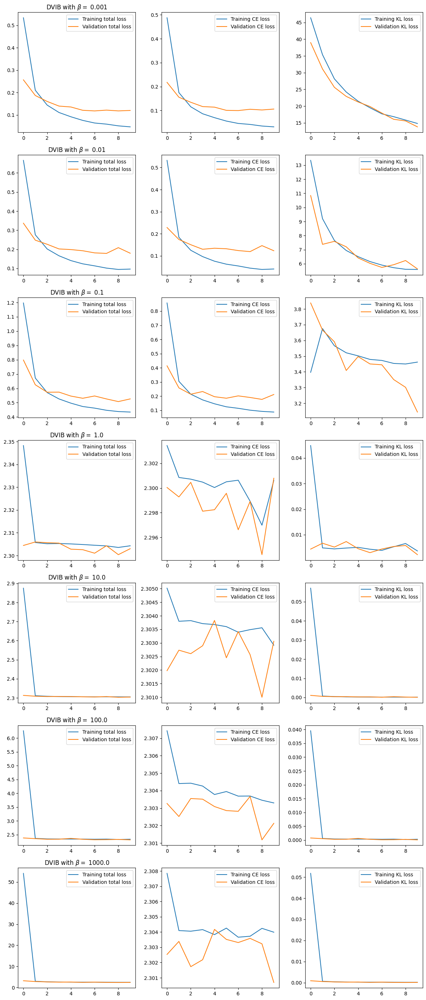

In [228]:
fig, axes = plt.subplots(len(betas), 3, figsize=(4*3, 4*len(betas)))

for beta, ax_row in zip(betas, axes):

    _, history = results[beta]

    ax1, ax2, ax3 = ax_row
    ax1.set_title(fr'DVIB with $\beta=$ {beta}')
    ax1.plot(history['Training total loss'], label='Training total loss')
    ax1.plot(history['Validation total loss'], label='Validation total loss')
    ax1.legend()

    ax2.plot(history['Training CE loss'], label='Training CE loss')
    ax2.plot(history['Validation CE loss'], label='Validation CE loss')
    ax2.legend()

    ax3.plot(history['Training KL loss'], label='Training KL loss')
    ax3.plot(history['Validation KL loss'], label='Validation KL loss')
    ax3.legend()

plt.tight_layout()

### Latent space geometry

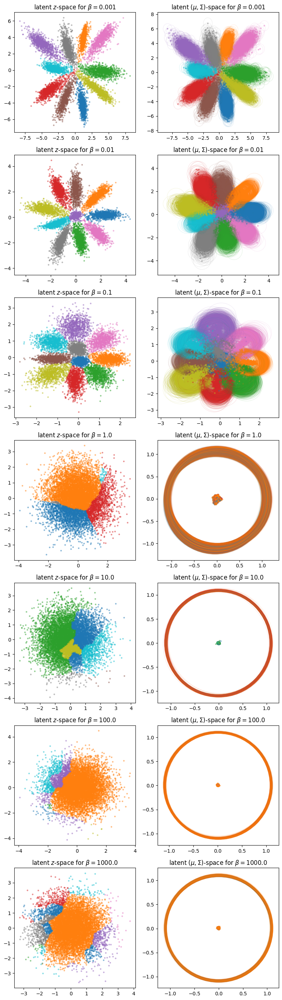

In [232]:
from matplotlib.patches import Ellipse
from matplotlib.collections import PatchCollection

fig, axes = plt.subplots(len(betas), 2, figsize=(4*2, 4*len(betas)))

mnist_colors = plt.cm.tab10(np.arange(10))

for beta, (ax1, ax2) in zip(betas, axes): 

    model, _ = results[beta]

    with torch.no_grad():
        for batch_X, batch_y in test_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)
            y_pred, z, mu, log_var = model(batch_X)

    decisions = y_pred.cpu().detach().argmax(dim=-1)

    ax1.scatter(z[:, 0].cpu().detach(), z[:, 1].cpu().detach(), c=decisions, cmap='tab10', s=5, alpha=0.4)
    ax1.set_title(fr'latent $z$-space for $\beta = {beta}$')

    covs = (log_var.detach().exp().cpu().numpy()[..., None] * np.identity(2))
    eigvals, eigvecs = np.linalg.eigh(covs)
    angles = np.degrees(np.arctan2(eigvecs[:, 1, 0], eigvecs[:, 0, 0]))

    n_std = 1.0  # Number of standard deviations
    shape = 2 * n_std * np.sqrt(eigvals+1j)
    widths = shape[:, 0].real
    heights = shape[:, 1].real

    colors = cmap1(np.arange(3))

    ellipses = [Ellipse(xy=mu[i], width=widths[i], height=heights[i], angle=angles[i], alpha=0.1) for i in range(len(mu))]
    collection = PatchCollection(ellipses, alpha=0.1, linewidths=1, facecolors='none', edgecolors=mnist_colors[decisions])

    ax2.add_collection(collection)
    ax2.scatter(mu[:, 0].cpu().detach(), mu[:, 1].cpu().detach(), c=decisions, cmap='tab10', s=5, alpha=0.4)
    ax2.set_title(fr'latent $(\mu, \Sigma)$-space for $\beta = {beta}$')

plt.tight_layout()

## MNIST with lower triangular covariance

Instead of parameterizing $\Sigma_\theta(\mathbf{x}) = \sigma^2 I_{d\times d}$, which results in an **Isotropic Gaussian**, we parameterize as follows
$$
    \Sigma_\theta(\mathbf{x}) = L L^T
$$
where the neural network outputs a lower triangular matrix $L$. The multiplication $LL^T$ ensures positive semi-definiteness. In particular, it ensures that the diagonal variances for each dimension $\sigma^2$ are always positive, and that the matrix is symmetric. 

Sampling using the reparameterization trick takes the form
$$
    \mathbf{z} = \mu + L \epsilon
$$

**Why $L$ instead of $LL^T$?** When applying the reparameterization trick, we use the square root of the (co)variance
$$
    \mathcal{N}(\mathbf{z} \;|\;\mu_\theta(\mathbf{x}), \Sigma_\theta(\mathbf{x})) \longleftrightarrow \mathbf{z} = \mu + \Sigma_\theta(\mathbf{x})^{1/2} \epsilon
$$

If we use a isotropic Gaussian $\Sigma_\theta(\mathbf{x}) = \sigma^2 I_{d\times d}$, then
$$
    \mathbf{z} = \mu + (\sigma^2 I_{d\times d})^{1/2} \epsilon
$$
$$
    \mathbf{z} = \mu + \sigma I_{d\times d} \epsilon
$$

If we use a full covariance matrix decomposed with Cholesky decomposition $\Sigma_\theta(\mathbf{x}) = LL^T$, then
$$
    \mathbf{z} = \mu + (LL^T)^{1/2} \epsilon
$$
$$
    \mathbf{z} = \mu + L \epsilon
$$


In [248]:
L = torch.tril(torch.randn(5, 5))

L @ L.T

tensor([[ 7.7735e-01, -1.3793e+00, -7.0578e-02, -1.6554e-01,  1.1670e+00],
        [-1.3793e+00,  1.2710e+01,  2.9163e+00,  1.3922e-01, -4.7857e+00],
        [-7.0578e-02,  2.9163e+00,  7.9209e-01,  5.0977e-03, -1.1780e+00],
        [-1.6554e-01,  1.3922e-01,  5.0977e-03,  7.1812e-01, -1.4433e+00],
        [ 1.1670e+00, -4.7857e+00, -1.1780e+00, -1.4433e+00,  1.2928e+01]])

In [249]:
import torchvision
import torchvision.transforms as transforms

DOWNLOAD_PATH = '../datasets'

# normalize so that the mean of the data is zero and the variance is one
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)) 
])

train_val = torchvision.datasets.MNIST(root=DOWNLOAD_PATH, train=True, download=True, transform=transform)
test = torchvision.datasets.MNIST(root=DOWNLOAD_PATH, train=False, download=True, transform=transform)
train, val = torch.utils.data.random_split(train_val, [55000, 5000])

len(train), len(val), len(test)

(55000, 5000, 10000)

In [250]:
from torch.utils.data import DataLoader

batch_size = 128
train_loader = DataLoader(train, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test, batch_size=len(test), shuffle=True)
val_loader = DataLoader(val, batch_size=len(val), shuffle=True)

### Adjusted encoder-decoder modules

In [ ]:
class Encoder(nn.Module):
    def __init__(self, z_size=2):
        super().__init__()
        self.z_size = z_size
        self.net = nn.Sequential(
            # 32 -> 16
            nn.Conv2d(1, 64, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64, affine=True),
            nn.ReLU(inplace=True),
            # 16 -> 8
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128, affine=True),
            nn.ReLU(inplace=True),
            # 8 -> 4
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256, affine=True),
            nn.ReLU(inplace=True),
            # 4 -> 1
            nn.Conv2d(256, z_size, kernel_size=3, stride=2, padding=0, bias=False),
        )
    
    def forward(self, X: torch.Tensor):
        return self.net(X)

class Decoder(nn.Module):
    def __init__(self, z_size=2, d_size=100, n_classes=10):
        super().__init__()
        self.z_size = z_size
        self.net = nn.Sequential(
            nn.Linear(z_size, d_size),
            nn.ReLU(),
            nn.Linear(d_size, n_classes)
        )

    def forward(self, X: torch.Tensor):
        return self.net(X)
    
class VAELowerTriangular(nn.Module):
    def __init__(self, encoder, decoder, z_size=2):
        super().__init__()
        self.z_size = z_size
        self.enc = encoder
        self.dec = decoder
    
    def encode(self, X: torch.Tensor):
        h = self.enc(X) # (batch_size, 2*z_dim)
        mu = h[:, :self.z_size].view(-1, self.z_size)       # mean vec mu: (batch_size, z_dim)
        # z_dim x z_dim lower triangular matrix L
        L = torch.zeros((X.shape[0], self.z_size, self.z_size)).to(mu.device)
        
        i, j = torch.tril_indices(self.z_size, self.z_size)
        # set lower triangular indices to prediced values
        L[:, i, j] = h[:, self.z_size:].squeeze()
        # diagonal should be positive, so exponentiate
        L.diagonal(dim1=1, dim2=2).exp_()
        return mu, L
    
    def decode(self, mu: torch.Tensor, L: torch.Tensor):
        eps = torch.randn(mu.shape[0], self.z_size).to(mu.device) # random eps \sim N(0, I)
        
        z = mu + torch.einsum('bij, bj -> bi', L, eps)
        y = self.dec(z)
        return y, z
    
    def forward(self, X: torch.Tensor):
        mu, L = self.encode(X)
        y, z = self.decode(mu, L)
        return y, z, mu, L

In [303]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Training constants
learning_rate = 1e-3
max_epochs = 10

# define model parameters
z_size = 2
enc_size = int(z_size + (z_size*(z_size+1))/2)
d_size = 100
n_classes = 10

### Training loop and objective

In [ ]:
def kl_divergence_with_cholesky(mu, L):
    """
    Args:
        mu: mean, shape (B, k) where k is latent dimension
        L: lower triangular Cholesky factor, shape (B, k, k)
    
    Returns:
        KL divergence averaged over batch (B,)
    """
    k = mu.shape[-1]
    
    # 1. mu^T mu term
    mu_squared = torch.sum(mu ** 2, dim=-1)  # (B,)
    
    # 2. tr(sigma) = tr(LL^T) = ||L||_F^2 (Frobenius norm squared)
    trace_term = torch.sum(L ** 2, dim=(-2, -1))  # (B,)
    
    # 3. log det(sigma) = log det(LL^T) = 2 * log det(L) = 2 * sum(log(diag(L)))
    # For lower triangular L, det(L) = product of diagonal elements
    log_det_term = 2 * torch.sum(torch.log(torch.diagonal(L, dim1=-2, dim2=-1) + 1e-8), dim=-1)  # (B,)
    
    # Combine all terms
    kl = 0.5 * (mu_squared + trace_term - k - log_det_term)
    
    return kl.mean()

In [305]:
from collections import defaultdict

def train_model_with_cholesky(model, max_epochs, train_dataloader, val_dataloader, optimizer, device, beta, verbose=False):
    # maintain history of train/val losses
    history = defaultdict(list)

    for epoch in range(max_epochs): 
        
        batch_loss = []
        for batch_X, batch_y in train_dataloader:
            
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)

            preds, _, mu, L = model(batch_X)
        
            kl_reg = kl_divergence_with_cholesky(mu, L)
            ce_loss = F.cross_entropy(preds, batch_y)
            loss = ce_loss + beta * kl_reg

            batch_loss.append([loss.item(), ce_loss.item(), kl_reg.item()])

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        batch_loss = np.array(batch_loss)
        history['Training total loss'].append(batch_loss[:, 0].mean())
        history['Training CE loss'].append(batch_loss[:, 1].mean())
        history['Training KL loss'].append(batch_loss[:, 2].mean())
        
        with torch.no_grad():

            batch_loss = []
            for batch_X, batch_y in val_dataloader:
                
                batch_X, batch_y = batch_X.to(device), batch_y.to(device)

                preds, _, mu, L = model(batch_X)
        
                kl_reg = kl_divergence_with_cholesky(mu, L)
                ce_loss = F.cross_entropy(preds, batch_y)
                loss = ce_loss + beta * kl_reg

                batch_loss.append([loss.item(), ce_loss.item(), kl_reg.item()])

            batch_loss = np.array(batch_loss)
            history['Validation total loss'].append(batch_loss[:, 0].mean())
            history['Validation CE loss'].append(batch_loss[:, 1].mean())
            history['Validation KL loss'].append(batch_loss[:, 2].mean())
            
        if verbose: print(f"{epoch=} \tTraining total loss, CE, KL = ({history['Training total loss'][-1]:.4f}, {history['Training CE loss'][-1]:.4f}, {history['Training KL loss'][-1]:.4f})\tValidation total loss, CE, KL = ({history['Validation total loss'][-1]:.4f}, {history['Validation CE loss'][-1]:.4f}, {history['Validation KL loss'][-1]:.4f})")
    
    return history

### Training

In [306]:
betas = [1e-3, 1e-2, 1e-1, 1e-0, 1e+1, 1e+2, 1e+3]

results = {}

for beta in betas:
    
    enc = Encoder(enc_size)
    dec = Decoder(z_size, d_size=d_size, n_classes=n_classes)

    model = VAELowerTriangular(enc, dec, z_size=2).to(device)

    optimizer = torch.optim.Adam(model.parameters(), learning_rate)

    print(f"Training model with {beta=}")
    history = train_model_with_cholesky(model, max_epochs, train_loader, val_loader, optimizer, device, beta, verbose=False)

    results[beta] = (model, history)

Training model with beta=0.001
Training model with beta=0.01
Training model with beta=0.1
Training model with beta=1.0
Training model with beta=10.0
Training model with beta=100.0
Training model with beta=1000.0


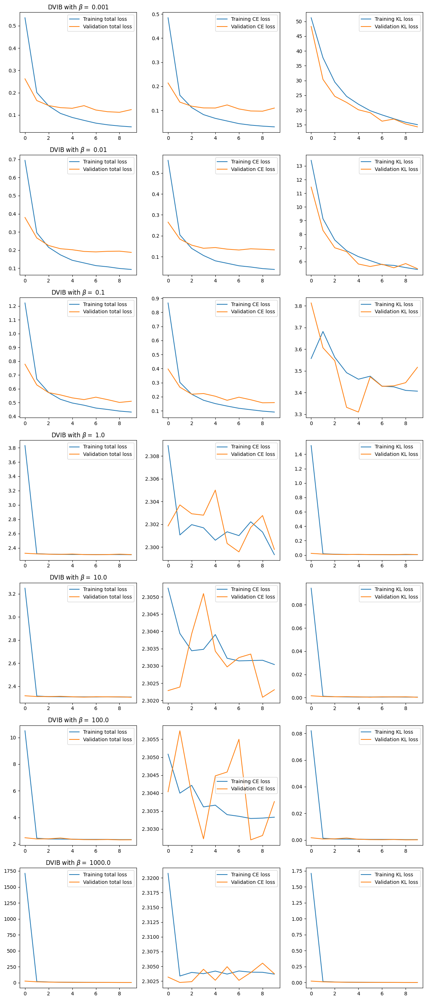

In [308]:
fig, axes = plt.subplots(len(betas), 3, figsize=(4*3, 4*len(betas)))

for beta, ax_row in zip(betas, axes):

    _, history = results[beta]

    ax1, ax2, ax3 = ax_row
    ax1.set_title(fr'DVIB with $\beta=$ {beta}')
    ax1.plot(history['Training total loss'], label='Training total loss')
    ax1.plot(history['Validation total loss'], label='Validation total loss')
    ax1.legend()

    ax2.plot(history['Training CE loss'], label='Training CE loss')
    ax2.plot(history['Validation CE loss'], label='Validation CE loss')
    ax2.legend()

    ax3.plot(history['Training KL loss'], label='Training KL loss')
    ax3.plot(history['Validation KL loss'], label='Validation KL loss')
    ax3.legend()

plt.tight_layout()

### Latent space geometry

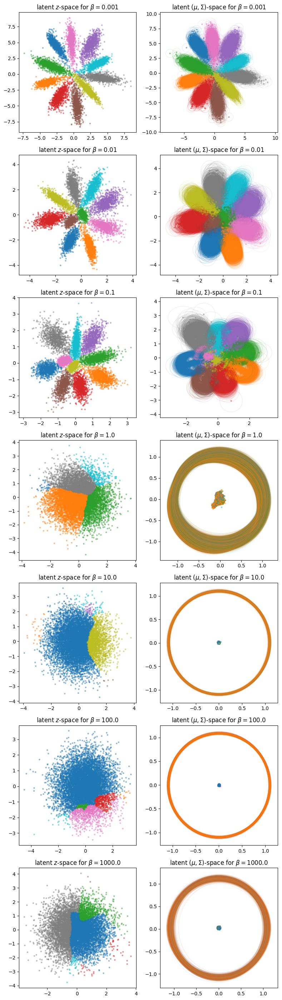

In [313]:
from matplotlib.patches import Ellipse
from matplotlib.collections import PatchCollection

fig, axes = plt.subplots(len(betas), 2, figsize=(4*2, 4*len(betas)))

mnist_colors = plt.cm.tab10(np.arange(10))

for beta, (ax1, ax2) in zip(betas, axes): 

    model, _ = results[beta]

    with torch.no_grad():
        for batch_X, batch_y in test_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)
            y_pred, z, mu, L = model(batch_X)

    decisions = y_pred.cpu().detach().argmax(dim=-1)

    ax1.scatter(z[:, 0].cpu().detach(), z[:, 1].cpu().detach(), c=decisions, cmap='tab10', s=5, alpha=0.4)
    ax1.set_title(fr'latent $z$-space for $\beta = {beta}$')

    covs = torch.einsum('bij, bij -> bij', L, L).detach().cpu().numpy()
    eigvals, eigvecs = np.linalg.eigh(covs)
    angles = np.degrees(np.arctan2(eigvecs[:, 1, 0], eigvecs[:, 0, 0]))

    n_std = 1.0  # Number of standard deviations
    shape = 2 * n_std * np.sqrt(eigvals+1j)
    widths = shape[:, 0].real
    heights = shape[:, 1].real

    colors = cmap1(np.arange(3))

    ellipses = [Ellipse(xy=mu[i], width=widths[i], height=heights[i], angle=angles[i], alpha=0.1) for i in range(len(mu))]
    collection = PatchCollection(ellipses, alpha=0.1, linewidths=1, facecolors='none', edgecolors=mnist_colors[decisions])

    ax2.add_collection(collection)
    ax2.scatter(mu[:, 0].cpu().detach(), mu[:, 1].cpu().detach(), c=decisions, cmap='tab10', s=5, alpha=0.4)
    ax2.set_title(fr'latent $(\mu, \Sigma)$-space for $\beta = {beta}$')

plt.tight_layout()